# Online Joint State and Parameters Estimation for HAR SSM
State space model
\begin{align*}
    &\theta_{t}^{(1)} = A(\theta_t^{(2)})\theta_{t-1}^{(1)} + \mathbf{c}v^{(1)}_t  \\
    &\theta_t^{(0)} = A(\theta_{t}^{(1)})\theta_{t-1}^{(0)} + \mathbf{c}v^{(0)}_{t} \\
    &y_t = \mathbf{c}^{\top} \theta_t^{(0)} + w_t
\end{align*}

where
\begin{align*}
    &A(\theta) = 
    \begin{bmatrix}
         \theta^{\top}  \\
         \mathbf{I}_{M-1} \quad \mathbf{0}
    \end{bmatrix}
    \, , \quad
    \mathbf{I}_M = 
    \begin{bmatrix}
        1_1 & 0 &  \dots & 0 \\ 
        0 & 1_2 &  \dots & 0 \\   
        \vdots &  \vdots & \ddots & \vdots \\
        0 & 0  & \dots & 1_{M}
    \end{bmatrix} \\ \\
    &\theta^{(i)}_t = (x_t^{(i)}, x_{t-1}^{(i)}, \dots, x_{t-M+1}^{(i)})^{\top}\,.
\end{align*}

Note: we clamp $\gamma_y = \frac{1}{2}$

In [1]:
using Images
img = load("../ffgs/HAR-online.png")

┌ Info: Precompiling Images [916415d5-f1e6-5110-898d-aaa5f9f070e0]
└ @ Base loading.jl:1260
┌ Info: Precompiling QuartzImageIO [dca85d43-d64c-5e67-8c65-017450d5d020]
└ @ Base loading.jl:1260
┌ Warning: QuartzImageIO created no image source
└ @ QuartzImageIO /Users/albertpod/.julia/packages/QuartzImageIO/xhiSX/src/QuartzImageIO.jl:47


In [1]:
using ProgressMeter
using ForneyLab
using ForneyLab: unsafeCov, unsafeMean, unsafePrecision
using LAR.Node, LAR.Data
using Random
using Plots
using LaTeXStrings
using LinearAlgebra

In [4]:
Random.seed!(42)

HARorder = 1

v_θ1 = 0.5
v_x = 1.0

dataHAR = generateHAR(1000, HARorder, levels=2, nvars=[v_θ1, v_x], stat=true)
coefs = dataHAR[1]
θ = [θ[1] for θ in dataHAR[2]]
x = [x[1] for x in dataHAR[3]]

# Observations
v_y = 2.0
y = [xi[1] + sqrt(v_y)*randn() for xi in dataHAR[3]];

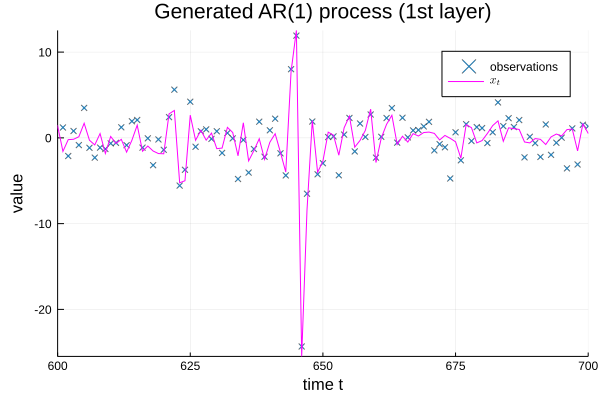

In [5]:
# Plotting the data
from = 600; upto = 700;
plot(xlims=(from, upto), ylims=(minimum(x[from:upto]), maximum(x[from:upto])))
scatter!(y, markershape = :xcross, markeralpha = 0.6,
        markersize = 2, xlabel="time t", ylabel="value", label="observations")
plot!(x, color=:magenta, label=L"x_t", title="Generated AR($HARorder) process (1st layer)")

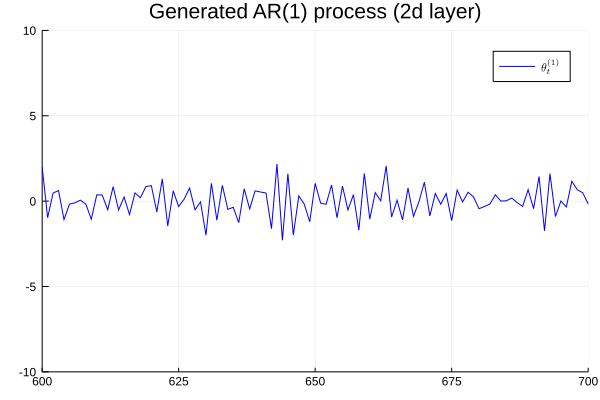

In [6]:
plot(xlims=(from, upto), ylims=(-10, 10))
plot!(θ, color=:blue, label=L"\theta_t^{(1)}", title="Generated AR($HARorder) process (2d layer)")

In [7]:
# Creating the graph
g = FactorGraph()

# Placeholders are used for priors and observations

# Upper layer
@RV θ2 ~ GaussianMeanPrecision(placeholder(:m_θ2, dims=(HARorder,)), placeholder(:w_θ2, dims=(HARorder, HARorder)))
@RV w_θ1 ~ Gamma(placeholder(:a_θ1), placeholder(:b_θ1))
@RV θ1_t_prev ~ GaussianMeanPrecision(placeholder(:m_θ1_t_prev, dims=(HARorder,)), placeholder(:w_θ1_t_prev, dims=(HARorder, HARorder)))
@RV θ1_t ~ Autoregressive(θ2, θ1_t_prev, w_θ1)

# Second layer
@RV w_x ~ Gamma(placeholder(:a_x), placeholder(:b_x))
@RV x_t_prev ~ GaussianMeanPrecision(placeholder(:m_x_t_prev, dims=(HARorder,)), placeholder(:w_x_t_prev, dims=(HARorder, HARorder)))
@RV x_t ~ Autoregressive(θ1_t, x_t_prev, w_x)

# Observation
c = zeros(HARorder); c[1] = 1;
@RV y_t ~ GaussianMeanPrecision(dot(c, x_t), placeholder(:w_y_t))

# Placeholder for data
placeholder(y_t, :y_t)

ForneyLab.draw(g)

<?xml version="1.0" encoding="UTF-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
 "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<!-- Generated by graphviz version 2.40.1 (20161225.0304)
 -->
<!-- Title: G Pages: 1 -->
 
 
 G 
 
<!-- 16987878616948575527 -->
 
 16987878616948575527 
 
 placeholder_a_θ1 
 
<!-- 10973942771380041565 -->
 
 10973942771380041565 
 
 placeholder_m_θ2 
 
<!-- 5929796569412289612 -->
 
 5929796569412289612 
 
 dot 
 dotproduct_1 
 
<!-- 12645853421542393674 -->
 
 12645853421542393674 
 
 clamp_1 
 
<!-- 5929796569412289612--12645853421542393674 -->
 
 5929796569412289612--12645853421542393674 
 
 clamp_1 
 1 out 
 3 in2 
 
<!-- 10222520679021882870 -->
 
 10222520679021882870 
 
 AR 
 autoregressive_2 
 
<!-- 5929796569412289612--10222520679021882870 -->
 
 5929796569412289612--10222520679021882870 
 
 x_t 
 1 y 
 2 in1 
 
<!-- 17081643310604455035 -->
 
 17081643310604455035 
 
 placeholder_m_x_t_prev 
 
<!-- 9299356950473057204 -->
 
 9299356950473057204 
 
 placeholder_b_θ1 
 
<!-- 17512582634358494311 -->
 
 17512582634358494311 
 
 placeholder_w_θ2 
 
<!-- 14024696715731096373 -->
 
 14024696715731096373 
 
 AR 
 autoregressive_1 
 
<!-- 2315642868878686212 -->
 
 2315642868878686212 
 
 Gam 
 gamma_1 
 
<!-- 14024696715731096373--2315642868878686212 -->
 
 14024696715731096373--2315642868878686212 
 
 w_θ1 
 1 out 
 4 γ 
 
<!-- 16801359543746067855 -->
 
 16801359543746067855 
 
 𝒩 
 gaussianmeanprecision_1 
 
<!-- 14024696715731096373--16801359543746067855 -->
 
 14024696715731096373--16801359543746067855 
 
 θ2 
 1 out 
 3 θ 
 
<!-- 18358179057939953458 -->
 
 18358179057939953458 
 
 𝒩 
 gaussianmeanprecision_2 
 
<!-- 14024696715731096373--18358179057939953458 -->
 
 14024696715731096373--18358179057939953458 
 
 θ1_t_prev 
 1 out 
 2 x 
 
<!-- 9040398775580967163 -->
 
 9040398775580967163 
 
 placeholder_w_θ1_t_prev 
 
<!-- 2315642868878686212--16987878616948575527 -->
 
 2315642868878686212--16987878616948575527 
 
 a_θ1 
 1 out 
 2 a 
 
<!-- 2315642868878686212--9299356950473057204 -->
 
 2315642868878686212--9299356950473057204 
 
 b_θ1 
 1 out 
 3 b 
 
<!-- 13021125806965622356 -->
 
 13021125806965622356 
 
 placeholder_b_x 
 
<!-- 86443006585190015 -->
 
 86443006585190015 
 
 𝒩 
 gaussianmeanprecision_3 
 
<!-- 86443006585190015--17081643310604455035 -->
 
 86443006585190015--17081643310604455035 
 
 m_x_t_prev 
 1 out 
 2 m 
 
<!-- 13495801465276173218 -->
 
 13495801465276173218 
 
 placeholder_w_x_t_prev 
 
<!-- 86443006585190015--13495801465276173218 -->
 
 86443006585190015--13495801465276173218 
 
 w_x_t_prev 
 1 out 
 3 w 
 
<!-- 3796827854635230987 -->
 
 3796827854635230987 
 
 placeholder_m_θ1_t_prev 
 
<!-- 7471152749985940707 -->
 
 7471152749985940707 
 
 placeholder_y_t 
 
<!-- 6259004242992789081 -->
 
 6259004242992789081 
 
 𝒩 
 gaussianmeanprecision_4 
 
<!-- 7471152749985940707--6259004242992789081 -->
 
 7471152749985940707--6259004242992789081 
 
 y_t 
 1 out 
 1 out 
 
<!-- 17822167720789252669 -->
 
 17822167720789252669 
 
 placeholder_w_y_t 
 
<!-- 2053008639856106007 -->
 
 2053008639856106007 
 
 placeholder_a_x 
 
<!-- 16801359543746067855--10973942771380041565 -->
 
 16801359543746067855--10973942771380041565 
 
 m_θ2 
 1 out 
 2 m 
 
<!-- 16801359543746067855--17512582634358494311 -->
 
 16801359543746067855--17512582634358494311 
 
 w_θ2 
 1 out 
 3 w 
 
<!-- 18358179057939953458--9040398775580967163 -->
 
 18358179057939953458--9040398775580967163 
 
 w_θ1_t_prev 
 1 out 
 3 w 
 
<!-- 18358179057939953458--3796827854635230987 -->
 
 18358179057939953458--3796827854635230987 
 
 m_θ1_t_prev 
 1 out 
 2 m 
 
<!-- 10222520679021882870--14024696715731096373 -->
 
 10222520679021882870--14024696715731096373 
 
 θ1_t 
 1 y 
 3 θ 
 
<!-- 10222520679021882870--86443006585190015 -->
 
 10222520679021882870--86443006585190015 
 
 x_t_prev 
 1 out 
 2 x 
 
<!-- 13975261710849925901 -->
 
 13975261710849925901 
 
 Gam 
 gamma_2 
 
<!--

In [9]:
# Specify recognition factorization
q = RecognitionFactorization(θ1_t, θ2, θ1_t_prev, w_θ1, x_t, x_t_prev, w_x,
                             ids=[:θ1_t :θ2 :θ1_t_prev :W_θ1 :X_t :X_t_prev :W_x])

algo = variationalAlgorithm(q)
algoF = freeEnergyAlgorithm(q)

# Load algorithms
eval(Meta.parse(algo))
eval(Meta.parse(algoF))

freeEnergy (generic function with 1 method)

In [9]:
# Storage for upper layer
m_θ1 = Vector{Vector{Float64}}(undef, length(y))
w_θ1 = Vector{Array{Float64, 2}}(undef, length(y))
m_θ1_prev = Vector{Vector{Float64}}(undef, length(y))
w_θ1_prev = Vector{Array{Float64, 2}}(undef, length(y))
m_θ2 = Vector{Vector{Float64}}(undef, length(y))
w_θ2 = Vector{Array{Float64, 2}}(undef, length(y))
a_θ1 = Vector{Float64}(undef, length(y))
b_θ1 = Vector{Float64}(undef, length(y))

# Storage for bottom layer
m_x = Vector{Vector{Float64}}(undef, length(y))
w_x = Vector{Array{Float64, 2}}(undef, length(y))
a_x = Vector{Float64}(undef, length(y))
b_x = Vector{Float64}(undef, length(y))

# Define values for upper layer
m_θ2_0 = ones(HARorder)
w_θ2_0 = diageye(HARorder)
a_θ1_0 = 0.00001
b_θ1_0 = 0.00001
m_θ1_prev_0 = ones(HARorder)
w_θ1_prev_0 = diageye(HARorder)
m_θ1_t_0 = ones(HARorder)
w_θ1_t_0 = diageye(HARorder)

# Define values for bottom layer
a_x_0 = tiny
b_x_0 = 1.0
m_x_t_prev_0 = zeros(HARorder)
w_x_t_prev_0 = diageye(HARorder)

# Priors upper layer
m_θ2_min = m_θ2_0
w_θ2_min = w_θ2_0
a_θ1_min = a_θ1_0
b_θ1_min = b_θ1_0
m_θ1_t_prev_min = m_θ1_prev_0
w_θ1_t_prev_min = w_θ1_prev_0

# Priors bottom layer
a_x_min = a_x_0
b_x_min = b_x_0
m_θ1_t_min = m_θ1_t_0
w_θ1_t_min = w_θ1_t_0
m_x_t_prev_min = m_x_t_prev_0
w_x_t_prev_min = w_x_t_prev_0;

In [10]:
data = Dict()
marginals = Dict()
n_its = 5

# Storage for scores
FHAR = []
logPDFsHAR = []

p = Progress(length(y), 1, "Observed ")
for t in 1:length(y)
    update!(p, t)
    # Upper Layer
    marginals[:θ2] = ProbabilityDistribution(Multivariate, GaussianMeanPrecision, m=m_θ2_min, w=w_θ2_min)
    marginals[:θ1_t_prev] = ProbabilityDistribution(Multivariate, GaussianMeanPrecision, m=m_θ1_t_prev_min, w=w_θ1_t_prev_min)
    marginals[:θ1_t] = ProbabilityDistribution(Multivariate, GaussianMeanPrecision, m=m_θ1_t_min, w=w_θ1_t_min)
    marginals[:w_θ1] = ProbabilityDistribution(Univariate, Gamma, a=a_θ1_min, b=b_θ1_min)
    # Bottom Layer
    marginals[:x_t_prev] = ProbabilityDistribution(Multivariate, GaussianMeanPrecision, m=m_x_t_prev_min, w=w_x_t_prev_min)
    marginals[:w_x] = ProbabilityDistribution(Univariate, Gamma, a=a_x_min, b=b_x_min)

    global m_θ2_min, w_θ2_min, m_θ1_t_prev_min, w_θ1_t_prev_min, a_θ1_min, b_θ1_min,
           m_θ1_t_min, w_θ1_t_min, m_x_t_prev_min, w_x_t_prev_min, a_x_min, b_x_min, data
    
    data = Dict(:y_t => y[t],
                    :w_y_t => v_y^-1,
                    :m_θ2 => m_θ2_min,
                    :w_θ2 => w_θ2_min,
                    :m_θ1_t_prev => m_θ1_t_prev_min,
                    :w_θ1_t_prev => w_θ1_t_prev_min,
                    :a_θ1 => a_θ1_min,
                    :b_θ1 => b_θ1_min,
                    :m_x_t_prev => m_x_t_prev_min,
                    :w_x_t_prev => w_x_t_prev_min,
                    :a_x => a_x_min,
                    :b_x => b_x_min)

    for i = 1:n_its
        
        stepX_t!(data, marginals)
        stepX_t_prev!(data, marginals)
        stepW_x!(data, marginals)
        stepθ1_t!(data, marginals)
        stepθ1_t_prev!(data, marginals)
        stepW_θ1!(data, marginals)
        stepθ2!(data, marginals)

    end
    m_θ1_prev[t] = unsafeMean(marginals[:θ1_t_prev])
    w_θ1_prev[t] = unsafePrecision(marginals[:θ1_t_prev])
    m_θ1[t] = unsafeMean(marginals[:θ1_t])
    w_θ1[t] = unsafePrecision(marginals[:θ1_t])
    m_θ2[t] = unsafeMean(marginals[:θ2])
    w_θ2[t] = unsafePrecision(marginals[:θ2])
    a_θ1[t] = marginals[:w_θ1].params[:a]
    b_θ1[t] = marginals[:w_θ1].params[:b]
    m_x[t] = unsafeMean(marginals[:x_t])
    w_x[t] = unsafePrecision(marginals[:x_t])
    a_x[t] = marginals[:w_x].params[:a]
    b_x[t] = marginals[:w_x].params[:b]

    m_θ2_min = m_θ2[t]
    w_θ2_min = w_θ2[t]
    m_θ1_t_prev_min = m_θ1_prev[t]
    w_θ1_t_prev_min = w_θ1_prev[t]
    m_θ1_t_min = m_θ1[t]
    m_θ1_t_min = m_θ1[t]
    m_x_t_prev_min = m_x[t]
    w_x_t_prev_min = w_x[t]
    a_θ1_min = a_θ1[t]
    b_θ1_min = b_θ1[t]
    a_x_min = a_x[t]
    b_x_min = b_x[t]
    push!(logPDFsHAR, logPDF(x[t], m_x[t][1], w_x[t][1]^-1))
end

Observed 100%|██████████████████████████████████████████| Time: 0:00:05


In [11]:
## Plotting AR coefs first layer
# Extracting estimates for x_t (first component of vector x̄_t)
m_xt = [m_x[1] for m_x in m_x]
v_xt = [v_x[1]^-1 for v_x in w_x]

# Extracting estimates for θ2_t (first component of vector θ̂2_t)
m_θ1t = [m_θ1[1] for m_θ1 in m_θ1]
v_θ1t = [v_x[1]^-1 for v_x in w_θ1];

In [12]:
println("Upper layer inference\n=======\n")

println("Coefs \n=========")
println("Estimated mean ", unsafeMean(marginals[:θ2]))
println("Estimated variance ", unsafeCov(marginals[:θ2]))
println("True ", coefs)

println("\nProcess noise variance\n=========")
println("Estimated ", mean(marginals[:w_θ1])^-1)
println("True ", 1.0)

println("\nState\n=========")
println("Mean ", mean(marginals[:θ1_t]))
println("Var ", var(marginals[:θ1_t]))

Upper layer inference

Coefs 
Estimated mean [0.019542387422491453]
Estimated variance [0.015529368800917681]
True [-0.5560268761463861]

Process noise variance
Estimated 0.4391856524652283
True 1.0

State
Mean [0.18410531831189528]
Var [0.26304899724858566]


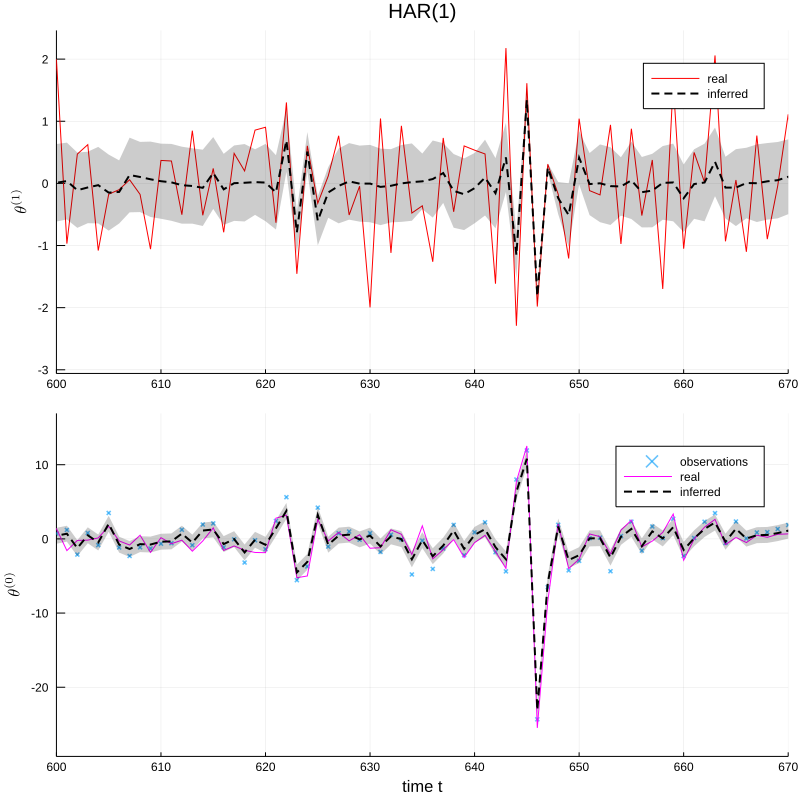

In [13]:
from = 600
upto = 670
scatter(y, markershape = :xcross, markeralpha = 0.6, xlims=(from, upto),
        ylims=(minimum(y[from:upto]) - 5, maximum(y[from:upto]) + 5),
        markersize = 2, xlabel="time t", ylabel=L"\theta^{(0)}", label="observations")
plot!(x, color=:magenta, label="real", title="")
pHAR = plot!(m_xt, ribbon=sqrt.(v_xt),
      linestyle=:dash, linewidth = 2,
      color=:black,
      fillalpha = 0.2,
      fillcolor = :black,
      label="inferred")

plot(xlims=(from, upto), ylabel=L"\theta^{(1)}")
plot!(θ[1:end], color=:red, label="real", title="Inference 2d layer")
pAR = plot!(m_θ1t, ribbon=sqrt.(v_θ1t),
      linestyle=:dash, linewidth = 2,
      color=:black,
      fillalpha = 0.2,
      fillcolor = :black,
      label="inferred", title="HAR(1)")

plot(pAR, pHAR, layout=(2,1), size=(800, 800))

# Animation

In [41]:
toshow = 20 # number of points to plot at once

anim = @animate for i in 300:length(m_ar)-toshow
    down = plot(xticks = i:div(toshow, 2):i+toshow, size=(800, 600));
    ylims!(minimum(y) - .1, maximum(y) + .1);
    scatter!(collect(i:i+toshow), y[i:i+toshow], label="observations", 
            markershape = :xcross, markeralpha = 0.6,
            markersize = 2)
    
    plot!(collect(i:i+toshow), m_xt[i:i+toshow], ribbon=sqrt.(v_xt[i:i+toshow]),
          linestyle=:dash, linewidth = 2, color=:black, fillalpha = 0.2, fillcolor = :black,
          label="inferred", title = "1st layer")
    
    plot!(collect(i:i+toshow), x[i:i+toshow], color = :magenta, linewidth = 1.0, label="real", xlabel="time t", ylabel=L"\theta^{(0)}")
    
    up = plot(xticks = i:div(toshow, 2):i+toshow, size=(800, 600)); ylims!(-5, 5);
    
    plot!(collect(i:i+toshow), m_θ1t[i:i+toshow], ribbon=sqrt.(v_θ1t[i:i+toshow]),
          linestyle=:dash, linewidth = 2, color=:black, fillalpha = 0.2, fillcolor = :black,
          label="inferred", title = "2d layer")
    
    plot!(collect(i:i+toshow), θ[i:i+toshow], color = :red, linewidth = 1.0, label="real", ylabel=L"\theta^{(1)}")
    
    plot(up, down, layout=(2,1),  size=(800, 600))
end

Animation("/var/folders/jn/1xv7kskx42v_97gx1xd8y_g40000gq/T/jl_lv6xpW", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000672.png", "000673.png", "000674.png", "000675.png", "000676.png", "000677.png", "000678.png", "000679.png", "000680.png", "000681.png"])

┌ Info: Saved animation to 
│   fn = /Users/albertpod/.julia/dev/LAR/src/demo/gifs/1stHAR.gif
└ @ Plots /Users/albertpod/.julia/packages/Plots/cc8wh/src/animation.jl:98


Plots.AnimatedGif("/Users/albertpod/.julia/dev/LAR/src/demo/gifs/1stHAR.gif")
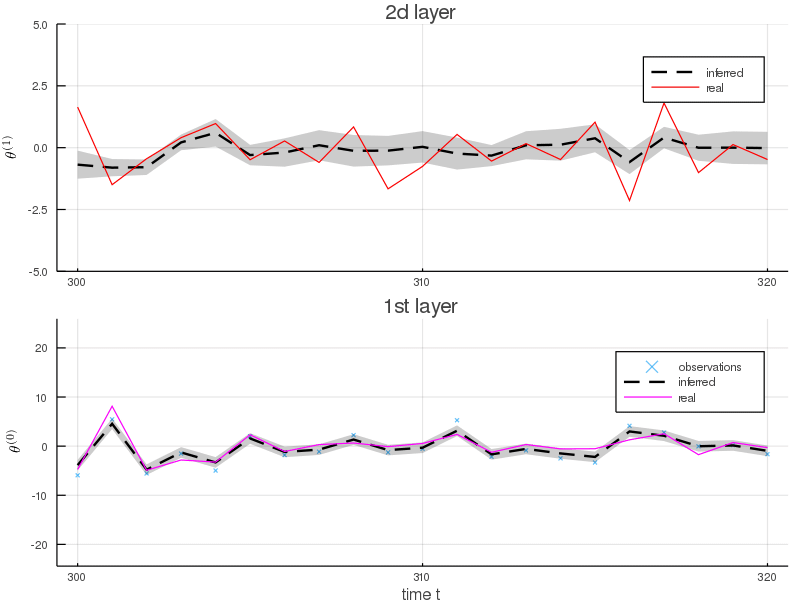

In [43]:
gif(anim, "gifs/1stHAR.gif", fps = 10)

In [44]:
# Plotting logPDF
anim = @animate for i in 1:length(logPDFsRW)
    s = plot(size=(800, 300))
    ylims!(-20, 0)
    xlims!(1, length(logPDFsRW))
    plot!(collect(1:i), logPDFsHAR[1:i], xlabel="time t", ylabel=L"\mathcal{L}_t", color=:blue, label="HAR($HARorder)")
    plot!(collect(1:i), logPDFsAR[1:i], color=:red, label="AR($HARorder)")
    plot!(collect(1:i), logPDFsRW[1:i], color=:green, label="RW")
end;

┌ Info: Saved animation to 
│   fn = /Users/albertpod/.julia/dev/LAR/src/demo/gifs/logPDFevo.gif
└ @ Plots /Users/albertpod/.julia/packages/Plots/cc8wh/src/animation.jl:98


Plots.AnimatedGif("/Users/albertpod/.julia/dev/LAR/src/demo/gifs/logPDFevo.gif")
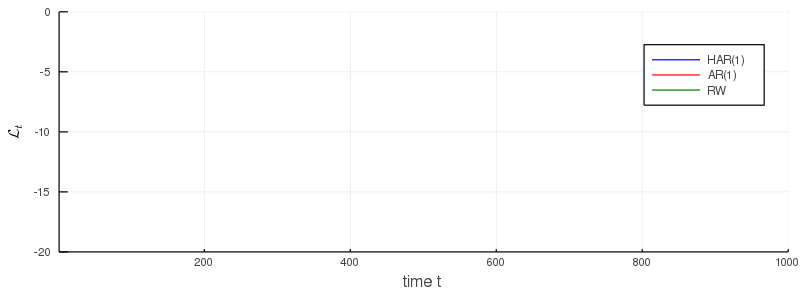

In [45]:
gif(anim, "gifs/logPDFevo.gif", fps = 10)